# Multi-Factor Trend Quality Assessment & Dynamic Ranking Trading System for Futures
This project develops a daily-frequency trend trading system for futures, employing multi-dimensional trend analysis and a dynamic ranking mechanism. The framework integrates five core indicators—momentum returns, ADX trend strength, volatility-adjusted returns, linear regression R², and its median-filtered value—to comprehensively evaluate both trend strength and smoothness.
Through adaptive weight optimization via grid search, the system identifies the optimal parameter set (w1=0.25, w2=0.00, w3=0.75), revealing that trend smoothness contributes significantly more to returns than trend strength.
**GitHub Repository:** https://github.com/Joanna-git/RA_24

In [1]:
# Required Libraries
import os
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from IPython.display import display
# Strategy Parameters
start_date = '2010-01-01'
end_date = '2025-05-20'
holding_days = 1  # Daily portfolio rebalancing

In [2]:
symbols = [
 'R.CN.CFE.IC.0004',
 'R.CN.CFE.IF.0004',
 'R.CN.CFE.IH.0004',
 'R.CN.CZC.CF.0004',
 'R.CN.CZC.FG.0004',
 'R.CN.CZC.MA.0004',
 'R.CN.CZC.OI.0004',
 'R.CN.CZC.RM.0004',
 'R.CN.CZC.SA.0004',
 'R.CN.CZC.SF.0004',
 'R.CN.CZC.SM.0004',
 'R.CN.CZC.SR.0004',
 'R.CN.CZC.TA.0004',
 'R.CN.CZC.WH.0004',
 'R.CN.CZC.ZC.0004',
 'R.CN.DCE.a.0004',
 'R.CN.DCE.c.0004',
 'R.CN.DCE.cs.0004',
 'R.CN.DCE.eg.0004',
 'R.CN.DCE.i.0004',
 'R.CN.DCE.j.0004',
 'R.CN.DCE.jd.0004',
 'R.CN.DCE.jm.0004',
 'R.CN.DCE.I.0004',
 'R.CN.DCE.m.0004',
 'R.CN.DCE.p.0004',
 'R.CN.DCE.pp.0004',
 'R.CN.DCE.v.0004',
 'R.CN.DCE.y.0004',
 'R.CN.SHF.ag.0004',
 'R.CN.SHF.al.0004',
 'R.CN.SHF.au.0004',
 'R.CN.SHF.bu.0004',
 'R.CN.SHF.cu.0004',
 'R.CN.SHF.hc.0004',
 'R.CN.SHF.ni.0004',
 'R.CN.SHF.pb.0004',
 'R.CN.SHF.rb.0004',
 'R.CN.SHF.ru.0004',
 'R.CN.SHF.sn.0004',
 'R.CN.SHF.zn.0004'
]


In [3]:
data_folder = './' 
# Automated Symbol List Construction
symbols = [f.replace("Alternative_price_", "").replace(".csv", "") 
           for f in os.listdir(data_folder) 
           if f.startswith("Alternative_price_R_CN") and f.endswith(".csv")]
# Load All CSV Files as DataFrame
def load_all_local_prices(symbols, folder):
    data_dict = {}
    for sym in symbols:
        filename = f"Alternative_price_{sym}.csv"
        filepath = os.path.join(folder, filename)
        df = pd.read_csv(filepath)
        df.columns = [col.strip().upper() for col in df.columns]  # Standardize column names
        df['CLOCK'] = pd.to_datetime(df['CLOCK'])
        df.set_index('CLOCK', inplace=True)
        df = df[['OPEN', 'HIGH', 'LOW', 'CLOSE']]
        data_dict[sym] = df
    return data_dict
Alternative_price_data = load_all_local_prices(symbols, data_folder)


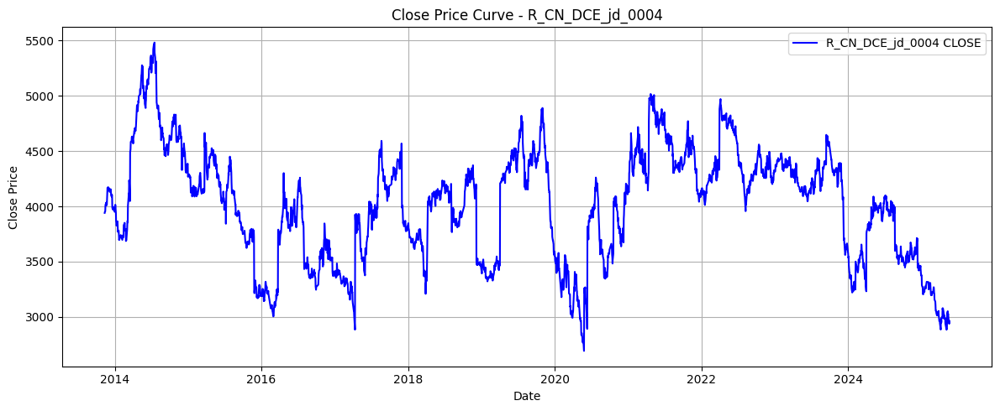

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

file_path = "./Alternative_price_R_CN_DCE_jd_0004.csv"  
df = pd.read_csv(file_path, parse_dates=["CLOCK"])
df.set_index("CLOCK", inplace=True)

# Plot Close Price Curve
plt.figure(figsize=(12, 5))
plt.plot(df.index, df["CLOSE"], label="R_CN_DCE_jd_0004 CLOSE", color='blue')
plt.title("Close Price Curve - R_CN_DCE_jd_0004")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [5]:
# Trend Factor Calculation

# Receives a price_df (DataFrame containing CLOCK, OPEN, CLOSE, HIGH, LOW price data, i.e. Alternative_price_data), and specifies:
# window: sliding window length (e.g., 14 days)
# norm_window: rolling window for normalization (e.g., 60 days)

def Alternative_calc_trend_factors(price_df, window=14, norm_window=60):
    print("Calculating trend strength and smoothness factors...")
    price = price_df['CLOSE'].values
    dates = price_df.index                        

    # === Momentum, Volatility Adjusted Returns ===

    # momentum: calculates simple return within the window (positive/negative values represent price change magnitude)
    momentum = (price[window:] - price[:-window]) / price[:-window]
    

    returns = pd.Series(price).pct_change().fillna(0)
    # volatility adjusted return (vol_adj_ret): mean daily return within window divided by standard deviation 
    # (positive/negative values represent return per unit risk)
    vol_adj_ret = returns.rolling(window).mean() / (returns.rolling(window).std() + 1e-8)
    vol_adj_ret = vol_adj_ret[window:]

    # === ADX Indicator ===
    # Calculates ADX (Average Directional Index) to measure trend strength
    # Calculate True Range (TR), +DI, -DI
    # 1. TR = max(HIGH - LOW, abs(HIGH - prev_CLOSE), abs(LOW - prev_CLOSE))
    # 2. +DM = HIGH - prev_HIGH if HIGH - prev_HIGH > 0 and HIGH - prev_HIGH > prev_LOW - LOW else 0
    # 3. -DM = prev_LOW - LOW if prev_LOW - LOW > 0 and prev_LOW - LOW > HIGH - prev_HIGH else 0
    # 4. +DI = 100 * (+DM / TR)
    # 5. -DI = 100 * (-DM / TR)
    # 6. DX = 100 * (abs(+DI - -DI) / (+DI + -DI))
    # 7. ADX = rolling_mean(DX, window)
    # Enhanced version: applies smoothing to tr (14-day average), then uses in +DI, -DI and DX calculation, 
    # then applies another smoothing to DX (14-day average) to get final ADX
    high = price_df['HIGH']
    low = price_df['LOW']
    close = price_df['CLOSE']
    prev_close = close.shift(1)
    prev_high = high.shift(1)
    prev_low = low.shift(1)

    tr = pd.concat([
        high - low,
        (high - prev_close).abs(),
        (low - prev_close).abs()
    ], axis=1).max(axis=1)

    plus_dm = (high - prev_high).where((high - prev_high > 0) & ((high - prev_high) > (prev_low - low)), 0)
    minus_dm = (prev_low - low).where((prev_low - low > 0) & ((prev_low - low) > (high - prev_high)), 0)

    tr14 = tr.rolling(window).mean()
    plus_di14 = 100 * plus_dm.rolling(window).mean() / (tr14 + 1e-8)
    minus_di14 = 100 * minus_dm.rolling(window).mean() / (tr14 + 1e-8)
    dx = 100 * (plus_di14 - minus_di14).abs() / ((plus_di14 + minus_di14) + 1e-8)
    adx = dx.rolling(window).mean()[window:]

    
    # === Construct Directional Trend Strength TS ===
    # 8. trend_dir = sign(momentum)
    # 9. trend_strength_raw = alpha * abs(momentum) + beta * ADX + gamma * abs(vol_adj_ret)
    # 10. ts = trend_dir * trend_strength_raw
    alpha, beta, gamma = 0.4, 0.4, 0.2
    trend_dir = np.sign(momentum)
    trend_strength_raw = alpha * np.abs(momentum) + beta * np.nan_to_num(adx.values) + gamma * np.abs(np.nan_to_num(vol_adj_ret.values))
    ts = trend_dir * trend_strength_raw

    # === Construct Smoothness TC (R-squared) ===
    strength = []
    consistency = []
    for i in range(window, len(price_df)):
        sub_y = price[i - window:i]
        x = np.arange(window).reshape(-1, 1)
        model = LinearRegression().fit(x, sub_y)
        pred = model.predict(x)
        mse = np.mean((sub_y - pred)**2)
        var = np.var(sub_y)
        tc = 1 - mse / var if var > 1e-6 else 0
        strength.append(ts[i - window])
        consistency.append(tc)

    strength_series = pd.Series(strength, index=dates[window:])
    consistency_series = pd.Series(consistency, index=dates[window:])

    # === Rolling Normalization (preventing look-ahead bias) ===
    strength_norm = (strength_series - strength_series.rolling(norm_window, min_periods=10).mean()) / (
        strength_series.rolling(norm_window, min_periods=10).std() + 1e-8)
    consistency_norm = (consistency_series - consistency_series.rolling(norm_window, min_periods=10).mean()) / (
        consistency_series.rolling(norm_window, min_periods=10).std() + 1e-8)

    # === RTC Median Filtering ===
    rtc = consistency_series.rolling(window=5, center=True, min_periods=1).median()

    # === Add Directional Score Adjustment ===
    signed_consistency_norm = np.sign(strength_norm) * consistency_norm
    signed_rtc = np.sign(strength_norm) * rtc

    # === Direction-Aware Scoring ===
    df = pd.DataFrame({
        'trend_strength': strength_series,
        'trend_consistency': consistency_series,
        'trend_strength_norm': strength_norm,
        'trend_consistency_norm': consistency_norm,
        'RTC': rtc
    })
    df['composite_score'] = (
        0.5 * strength_norm +
        0.25 * signed_consistency_norm +
        0.25 * signed_rtc
    )
    df['symbol'] = price_df.columns[-1] if 'symbol' not in price_df.columns else price_df['symbol'].iloc[0]
    df.index.name = 'date'
    return df

In [6]:
# === Build Multi-Asset Scoring Matrix ===
def get_all_scores(Alternative_price_data):
    all_scores = []
    for sym, df in Alternative_price_data.items():
        try:
            print(f"Calculating factors: {sym}")
            score_df = Alternative_calc_trend_factors(df)
            score_df['symbol'] = sym
            all_scores.append(score_df)
        except Exception as e:
            print(f"Skipping {sym}, error: {e}")
            continue
    result = pd.concat(all_scores)
    result.to_csv("Alternative_trend_factor_scores.csv")
    return result
Alternative_score_data = get_all_scores(Alternative_price_data)

Calculating factors: R_CN_CFE_IC_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_CFE_IF_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_CFE_IH_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_CZC_CF_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_CZC_FG_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_CZC_MA_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_CZC_OI_0004
Calculating trend strength and smoothness factors...
Skipping R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating factors: R_CN_CZC_RM_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_CZC_SA_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_CZC_SF_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_CZC_SM_0

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating factors: R_CN_CZC_ZC_0004
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating factors: R_CN_DCE_a_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_DCE_cs_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_DCE_c_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_DCE_eg_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_DCE_i_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_DCE_jd_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_DCE_jm_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_DCE_j_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_DCE_m_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_DCE_pp_0004
Calculating trend strength and smoothness factors...
Calculating factors: R_CN_DCE_p_0004
Ca

In [7]:
def evaluate_backtest(pnl_df):
    df = pnl_df.copy().dropna()
    df['daily_return'] = df['balance'].pct_change().fillna(0)
    df['cum_return'] = (1 + df['daily_return']).cumprod()

    # Annualized Return
    annual_return = df['cum_return'].iloc[-1]**(252 / len(df)) - 1
    # Maximum Drawdown
    peak = df['cum_return'].cummax()
    drawdown = (df['cum_return'] - peak) / peak
    max_drawdown = drawdown.min()
    # Sharpe Ratio
    sharpe = df['daily_return'].mean() / (df['daily_return'].std() + 1e-8) * np.sqrt(252)
    # Calmar Ratio
    calmar = annual_return / abs(max_drawdown) if max_drawdown != 0 else np.nan
    # Win Rate & Profit/Loss Ratio
    win_trades = df[df['pnl'] > 0]['pnl']
    loss_trades = df[df['pnl'] < 0]['pnl']
    win_rate = len(win_trades) / (len(win_trades) + len(loss_trades)) if (len(win_trades) + len(loss_trades)) > 0 else 0
    avg_profit = win_trades.mean() if not win_trades.empty else 0
    avg_loss = abs(loss_trades.mean()) if not loss_trades.empty else 1e-8
    profit_loss_ratio = avg_profit / avg_loss if avg_loss != 0 else np.nan

    metrics = {
        'Annual Return': f'{annual_return:.2%}',
        'Max Drawdown': f'{max_drawdown:.2%}',
        'Sharpe Ratio': f'{sharpe:.2f}',
        'Calmar Ratio': f'{calmar:.2f}',
        'Win Rate': f'{win_rate:.2%}',
        'Profit/Loss Ratio': f'{profit_loss_ratio:.2f}',
        'Avg Holding Days': 1
    }
    return metrics

In [8]:
# Read multiplier mapping table
multiplier_df = pd.read_csv("main_contract_multiplier_map(copy).csv")

# Convert symbols in multiplier_df to underscore format to ensure matching with symbols
multiplier_df['main_contract'] = multiplier_df['main_contract'].str.replace('.', '_')
multiplier_df.set_index('main_contract', inplace=True)

# Convert multiplier mapping table to dictionary
multiplier_map = multiplier_df['multiplier'].to_dict()

Starting long-short backtest (using multipliers for position sizing)...
2010-01-22 → 2010-01-25 | Long: [] | Short: [] | PnL: 0.00 | Balance: 10000000.00
2010-01-25 → 2010-01-26 | Long: [] | Short: [] | PnL: 0.00 | Balance: 10000000.00
2010-01-26 → 2010-01-27 | Long: [] | Short: [] | PnL: 0.00 | Balance: 10000000.00
2010-01-27 → 2010-01-28 | Long: [] | Short: [] | PnL: 0.00 | Balance: 10000000.00
2010-01-28 → 2010-01-29 | Long: [] | Short: [] | PnL: 0.00 | Balance: 10000000.00
2010-01-29 → 2010-02-01 | Long: [] | Short: [] | PnL: 0.00 | Balance: 10000000.00
2010-02-01 → 2010-02-02 | Long: [] | Short: [] | PnL: 0.00 | Balance: 10000000.00
2010-02-02 → 2010-02-03 | Long: [] | Short: [] | PnL: 0.00 | Balance: 10000000.00
2010-02-03 → 2010-02-04 | Long: [] | Short: [] | PnL: 0.00 | Balance: 10000000.00
2010-02-04 → 2010-02-05 | Long: ['R_CN_DCE_v_0004', 'R_CN_CZC_TA_0004', 'R_CN_DCE_y_0004'] | Short: ['R_CN_SHF_cu_0004', 'R_CN_DCE_m_0004', 'R_CN_SHF_ru_0004'] | PnL: 91720.00 | Balance: 100

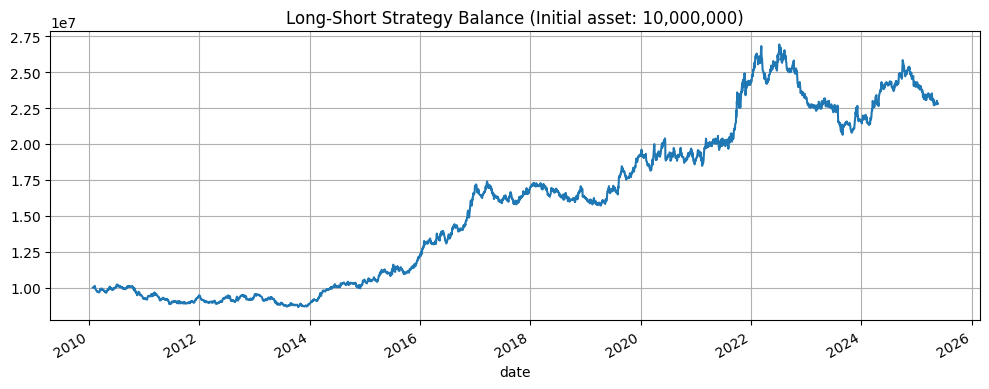


=== Strategy Performance Metrics ===
Annual Return: 5.75%
Max Drawdown: -23.34%
Sharpe Ratio: 0.62
Calmar Ratio: 0.25
Win Rate: 51.65%
Profit/Loss Ratio: 1.03
Avg Holding Days: 1


In [9]:
# === Long-Short Portfolio Backtest ===
def run_long_short_backtest(score_df, price_data, multiplier_df, top_n=3, init_cap=1e7):
    print("Starting long-short backtest (using multipliers for position sizing)...")
    multiplier_map = multiplier_df['multiplier'].to_dict()

    score_pivot = score_df.reset_index().pivot(index='date', columns='symbol', values='composite_score')
    capital = init_cap
    records = []

    for i in range(len(score_pivot.index) - 1):
        date = score_pivot.index[i]
        next_date = score_pivot.index[i + 1]

        scores = score_pivot.loc[date].dropna()
        long_list = scores.sort_values(ascending=False).head(top_n).index.tolist()
        short_list = scores.sort_values().head(top_n).index.tolist()

        alloc_long = capital / (2 * top_n)
        alloc_short = capital / (2 * top_n)

        pnl = 0
        for sym in long_list:
            try:
                entry = price_data[sym].loc[date, 'CLOSE']
                exit = price_data[sym].loc[next_date, 'CLOSE']
                mult = multiplier_map.get(sym, 1)
                hand = int(alloc_long // (entry * mult))
                pnl += hand * mult * (exit - entry)
            except Exception as e:
                print(f"Long position {sym} error: {e}")

        for sym in short_list:
            try:
                entry = price_data[sym].loc[date, 'CLOSE']
                exit = price_data[sym].loc[next_date, 'CLOSE']
                mult = multiplier_map.get(sym, 1)
                hand = int(alloc_short // (entry * mult))
                pnl += hand * mult * (entry - exit)  # Short profit comes from price decline
            except Exception as e:
                print(f"Short position {sym} error: {e}")

        capital += pnl
        records.append({'date': next_date, 'pnl': pnl, 'balance': capital})
        print(f"{date.date()} → {next_date.date()} | Long: {long_list} | Short: {short_list} | PnL: {pnl:.2f} | Balance: {capital:.2f}")

    pnl_df = pd.DataFrame(records)
    pnl_df.set_index('date', inplace=True)
    pnl_df.to_csv("long_short_backtest.csv")

    pnl_df['balance'].plot(title="Long-Short Strategy Balance (Initial asset: 10,000,000)", figsize=(10, 4))
    plt.grid()
    plt.tight_layout()
    plt.show()
    # === Output Performance Metrics ===
    metrics = evaluate_backtest(pnl_df)
    print("\n=== Strategy Performance Metrics ===")
    for k, v in metrics.items():
        print(f"{k}: {v}")
    return pnl_df


pnl_df = run_long_short_backtest(Alternative_score_data, Alternative_price_data, multiplier_df)

In [10]:
print(Alternative_price_data.keys())
print(Alternative_score_data['symbol'].unique())


dict_keys(['R_CN_CFE_IC_0004', 'R_CN_CFE_IF_0004', 'R_CN_CFE_IH_0004', 'R_CN_CZC_CF_0004', 'R_CN_CZC_FG_0004', 'R_CN_CZC_MA_0004', 'R_CN_CZC_OI_0004', 'R_CN_CZC_RM_0004', 'R_CN_CZC_SA_0004', 'R_CN_CZC_SF_0004', 'R_CN_CZC_SM_0004', 'R_CN_CZC_SR_0004', 'R_CN_CZC_TA_0004', 'R_CN_CZC_WH_0004', 'R_CN_CZC_ZC_0004', 'R_CN_DCE_a_0004', 'R_CN_DCE_cs_0004', 'R_CN_DCE_c_0004', 'R_CN_DCE_eg_0004', 'R_CN_DCE_i_0004', 'R_CN_DCE_jd_0004', 'R_CN_DCE_jm_0004', 'R_CN_DCE_j_0004', 'R_CN_DCE_m_0004', 'R_CN_DCE_pp_0004', 'R_CN_DCE_p_0004', 'R_CN_DCE_v_0004', 'R_CN_DCE_y_0004', 'R_CN_SHF_ag_0004', 'R_CN_SHF_al_0004', 'R_CN_SHF_au_0004', 'R_CN_SHF_bu_0004', 'R_CN_SHF_cu_0004', 'R_CN_SHF_hc_0004', 'R_CN_SHF_ni_0004', 'R_CN_SHF_pb_0004', 'R_CN_SHF_rb_0004', 'R_CN_SHF_ru_0004', 'R_CN_SHF_sn_0004', 'R_CN_SHF_zn_0004'])
['R_CN_CFE_IC_0004' 'R_CN_CFE_IF_0004' 'R_CN_CFE_IH_0004'
 'R_CN_CZC_CF_0004' 'R_CN_CZC_FG_0004' 'R_CN_CZC_MA_0004'
 'R_CN_CZC_RM_0004' 'R_CN_CZC_SA_0004' 'R_CN_CZC_SF_0004'
 'R_CN_CZC_SM_0004' 'R

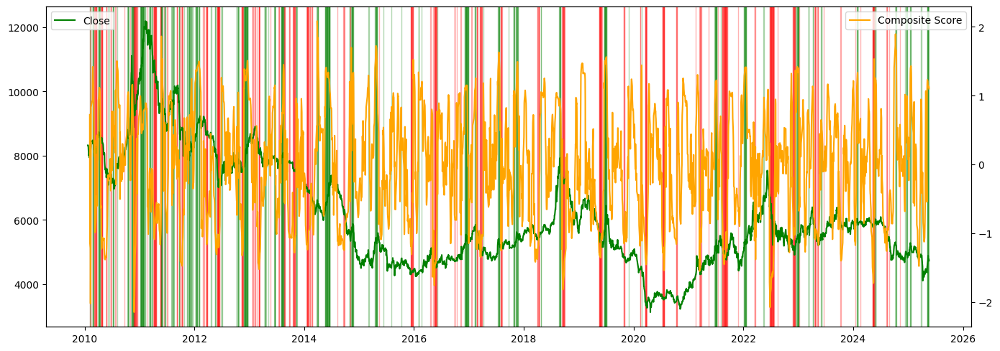

In [11]:
# Visualization of Signals
import matplotlib.pyplot as plt

def mark_long_short_signal(score_df, symbol, top_n=3, bottom_n=3):
    df = score_df[score_df['symbol'] == symbol].copy()
    score_pivot = score_df.reset_index().pivot(index='date', columns='symbol', values='composite_score')

    df['long_signal'] = score_pivot.rank(axis=1, ascending=False)[symbol] <= top_n
    df['short_signal'] = score_pivot.rank(axis=1, ascending=True)[symbol] <= bottom_n
    return df

def plot_signal_simulation(score_df, price_data, symbol, top_n=3, bottom_n=3):
    df_score = score_df[score_df['symbol'] == symbol].copy().reset_index()
    df_price = price_data[symbol].copy()

    df_score['date'] = pd.to_datetime(df_score['date'])
    df = pd.merge(df_score, df_price, left_on='date', right_index=True, how='inner')
    df.set_index('date', inplace=True)

    signal_df = mark_long_short_signal(score_df, symbol, top_n, bottom_n)
    df['long_signal'] = signal_df.reset_index().set_index('date').reindex(df.index)['long_signal']
    df['short_signal'] = signal_df.reset_index().set_index('date').reindex(df.index)['short_signal']

    fig, ax1 = plt.subplots(figsize=(14, 5))
    ax1.plot(df.index, df['CLOSE'], label='Close', color='green')
    ax2 = ax1.twinx()
    ax2.plot(df.index, df['composite_score'], label='Composite Score', color='orange')

    for i in range(len(df)):
        if df['long_signal'].iloc[i]:
            ax1.axvspan(df.index[i], df.index[i], color='green', alpha=0.3)
        elif df['short_signal'].iloc[i]:
            ax1.axvspan(df.index[i], df.index[i], color='red', alpha=0.3)

    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

plot_signal_simulation(Alternative_score_data, Alternative_price_data, 'R_CN_CZC_TA_0004', top_n=3, bottom_n=3)


In [12]:
def extract_pta_position_signal(score_df, top_n=3):
    """
    Based on scoring data, extract whether PTA is in long (1), short (-1), or neutral (0) position each trading day
    """
    score_pivot = score_df.reset_index().pivot(index='date', columns='symbol', values='composite_score')
    position_signal = []

    for i in range(len(score_pivot.index) - 1):
        date = score_pivot.index[i]
        scores = score_pivot.loc[date].dropna()
        long_list = scores.sort_values(ascending=False).head(top_n).index.tolist()
        short_list = scores.sort_values().head(top_n).index.tolist()

        if 'R_CN_CZC_TA_0004' in long_list:
            signal = 1
        elif 'R_CN_CZC_TA_0004' in short_list:
            signal = -1
        else:
            signal = 0

        position_signal.append({'date': date, 'position': signal})

    df_position = pd.DataFrame(position_signal).set_index('date')
    return df_position

In [13]:
def plot_strategy_position(df_balance, df_price, df_position):
    plt.style.use('dark_background')
    fig, ax1 = plt.subplots(figsize=(16, 6))

    ax1.plot(df_balance.index, df_balance.values, color='violet', label='Balance_left', linewidth=2)
    ax1.set_ylabel("Balance", color='violet')

    bar_heights = df_balance.max() * 0.25
    bar_values = df_position['position'].values * bar_heights
    ax1.bar(df_position.index, bar_values, width=1.5, alpha=0.4, color='cyan', label='position_signal')

    ax2 = ax1.twinx()
    ax2.plot(df_price.index, df_price.values, color='skyblue', label='close_right', linewidth=1.5)
    ax2.set_ylabel("PTA Close Price", color='skyblue')

    handles1, labels1 = ax1.get_legend_handles_labels()
    handles2, labels2 = ax2.get_legend_handles_labels()
    fig.legend(handles1 + handles2, labels1 + labels2, loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=3)

    plt.title("Strategy Backtest Position Chart (PTA, Long-Short Portfolio)", fontsize=14)
    plt.tight_layout()
    plt.show()


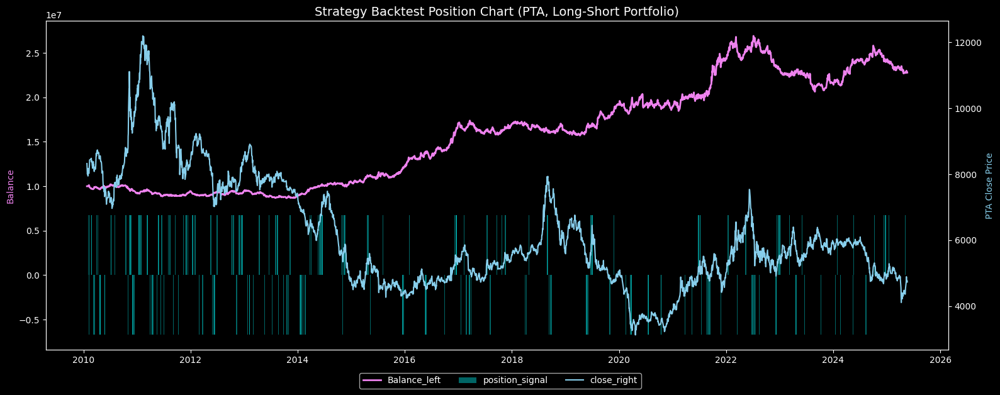

In [14]:
pta_price = Alternative_price_data['R_CN_CZC_TA_0004']['CLOSE']
pta_position = extract_pta_position_signal(Alternative_score_data, top_n=3)
pta_balance = pnl_df['balance']

# index alignment
pta_price = pta_price[pta_price.index.isin(pta_balance.index)]
pta_position = pta_position[pta_position.index.isin(pta_balance.index)]

plot_strategy_position(pta_balance, pta_price, pta_position)


In [15]:
def evaluate_pta_signals(position_df, price_series):
    df = pd.DataFrame({
        'position': position_df['position'],
        'close': price_series
    }).dropna()

    df['next_close'] = df['close'].shift(-1)
    df['price_change'] = df['next_close'] - df['close']
    df['pnl'] = df['position'] * df['price_change']  # Positive for profit, negative for loss

    trades = df[df['position'] != 0].copy()

    win_trades = trades[trades['pnl'] > 0]
    loss_trades = trades[trades['pnl'] < 0]

    win_rate = len(win_trades) / len(trades) if len(trades) > 0 else 0
    avg_win = win_trades['pnl'].mean() if not win_trades.empty else 0
    avg_loss = -loss_trades['pnl'].mean() if not loss_trades.empty else 0
    win_loss_ratio = avg_win / avg_loss if avg_loss != 0 else np.nan

    print(f"PTA Strategy Win Rate: {win_rate:.2%}")
    print(f"Win/Loss Ratio: {win_loss_ratio:.2f}")
    
    return {
        'win_rate': win_rate,
        'win_loss_ratio': win_loss_ratio,
        'total_trades': len(trades)
    }
pta_stats = evaluate_pta_signals(pta_position, pta_price)

PTA Strategy Win Rate: 49.15%
Win/Loss Ratio: 1.05


Testing weights w1=0.00, w2=0.00, w3=1.00
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

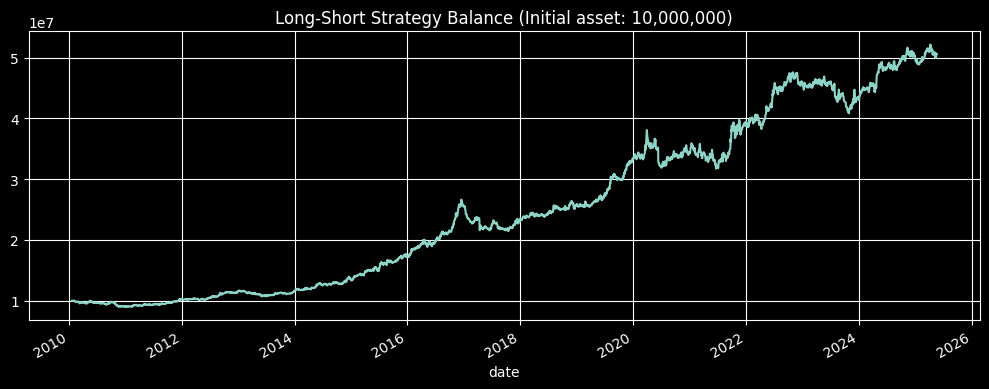


=== Strategy Performance Metrics ===
Annual Return: 11.60%
Max Drawdown: -19.38%
Sharpe Ratio: 1.11
Calmar Ratio: 0.60
Win Rate: 53.11%
Profit/Loss Ratio: 1.05
Avg Holding Days: 1
Weight combination (0.00,0.00,1.00) Sharpe: 1.108
Testing weights w1=0.00, w2=0.25, w3=0.75
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

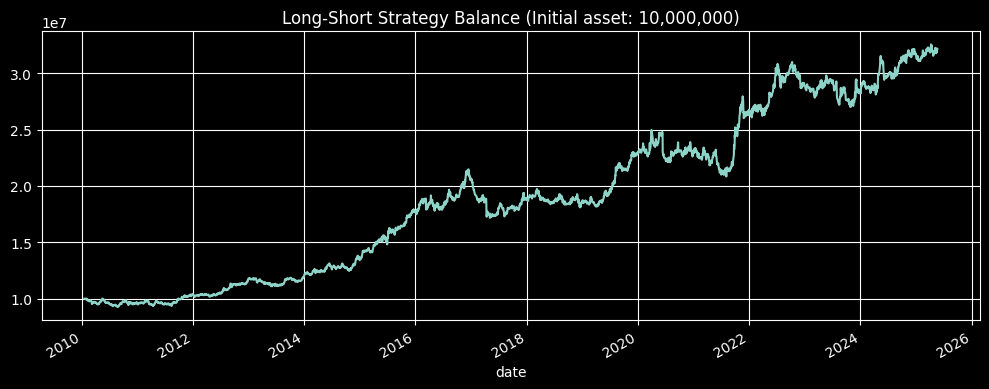


=== Strategy Performance Metrics ===
Annual Return: 8.23%
Max Drawdown: -19.99%
Sharpe Ratio: 0.83
Calmar Ratio: 0.41
Win Rate: 52.40%
Profit/Loss Ratio: 1.04
Avg Holding Days: 1
Weight combination (0.00,0.25,0.75) Sharpe: 0.827
Testing weights w1=0.00, w2=0.50, w3=0.50
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength 

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

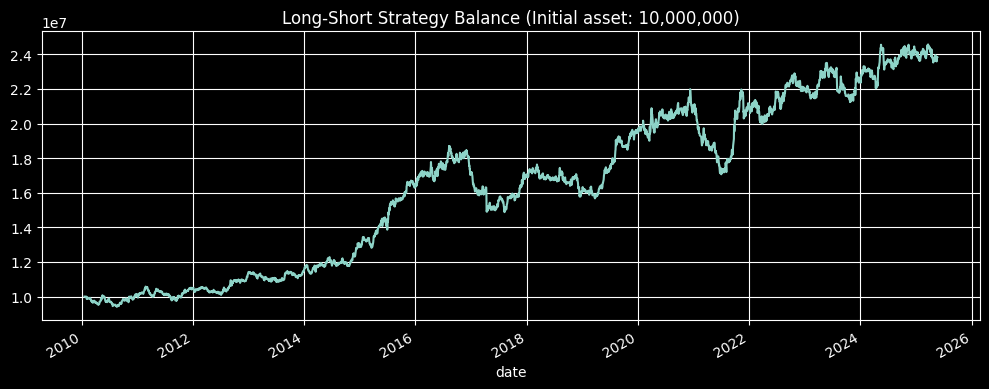


=== Strategy Performance Metrics ===
Annual Return: 6.06%
Max Drawdown: -22.36%
Sharpe Ratio: 0.65
Calmar Ratio: 0.27
Win Rate: 51.29%
Profit/Loss Ratio: 1.05
Avg Holding Days: 1
Weight combination (0.00,0.50,0.50) Sharpe: 0.655
Testing weights w1=0.00, w2=0.75, w3=0.25
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength 

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

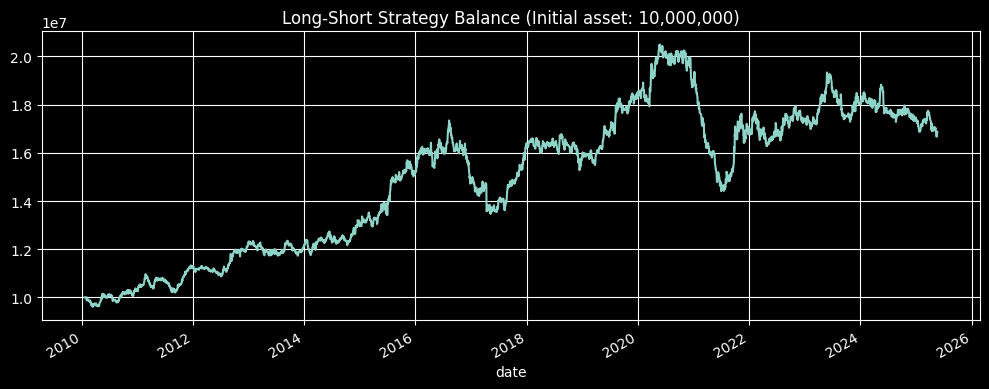


=== Strategy Performance Metrics ===
Annual Return: 3.60%
Max Drawdown: -29.70%
Sharpe Ratio: 0.43
Calmar Ratio: 0.12
Win Rate: 51.21%
Profit/Loss Ratio: 1.01
Avg Holding Days: 1
Weight combination (0.00,0.75,0.25) Sharpe: 0.428
Testing weights w1=0.00, w2=1.00, w3=0.00
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength 

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

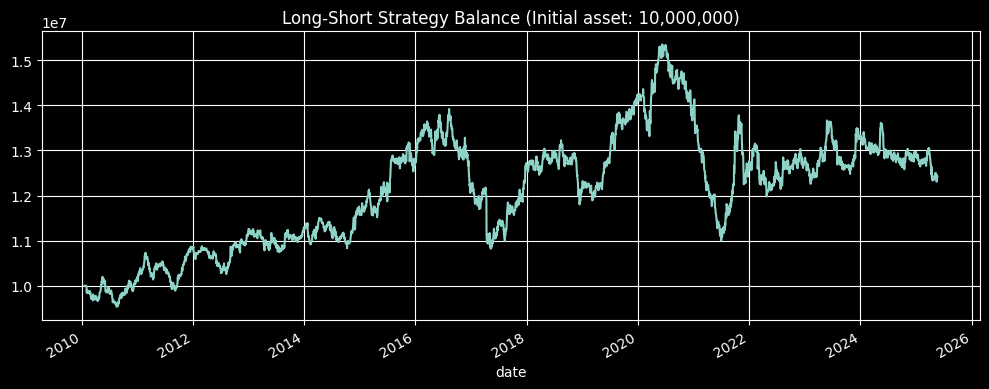


=== Strategy Performance Metrics ===
Annual Return: 1.48%
Max Drawdown: -28.34%
Sharpe Ratio: 0.21
Calmar Ratio: 0.05
Win Rate: 50.75%
Profit/Loss Ratio: 1.00
Avg Holding Days: 1
Weight combination (0.00,1.00,0.00) Sharpe: 0.210
Testing weights w1=0.25, w2=0.00, w3=0.75
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength 

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

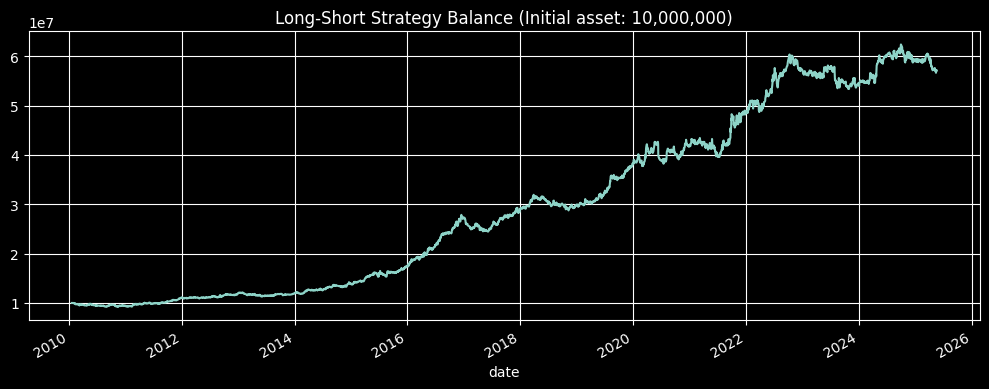


=== Strategy Performance Metrics ===
Annual Return: 12.52%
Max Drawdown: -12.11%
Sharpe Ratio: 1.23
Calmar Ratio: 1.03
Win Rate: 52.88%
Profit/Loss Ratio: 1.07
Avg Holding Days: 1
Weight combination (0.25,0.00,0.75) Sharpe: 1.232
Testing weights w1=0.25, w2=0.25, w3=0.50
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

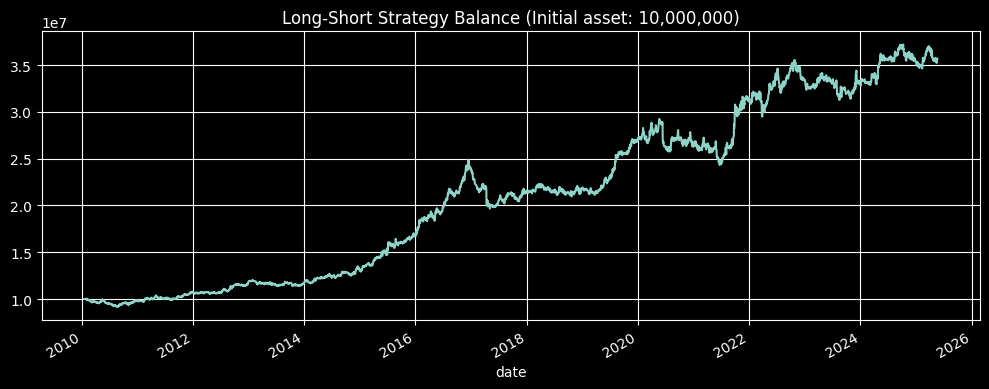


=== Strategy Performance Metrics ===
Annual Return: 9.00%
Max Drawdown: -20.99%
Sharpe Ratio: 0.90
Calmar Ratio: 0.43
Win Rate: 52.42%
Profit/Loss Ratio: 1.04
Avg Holding Days: 1
Weight combination (0.25,0.25,0.50) Sharpe: 0.899
Testing weights w1=0.25, w2=0.50, w3=0.25
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength 

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

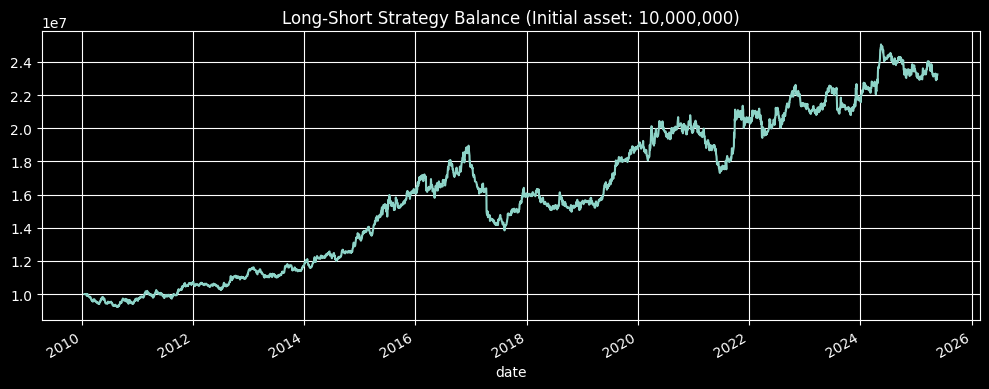


=== Strategy Performance Metrics ===
Annual Return: 5.88%
Max Drawdown: -26.96%
Sharpe Ratio: 0.62
Calmar Ratio: 0.22
Win Rate: 51.70%
Profit/Loss Ratio: 1.03
Avg Holding Days: 1
Weight combination (0.25,0.50,0.25) Sharpe: 0.623
Testing weights w1=0.25, w2=0.75, w3=0.00
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength 

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

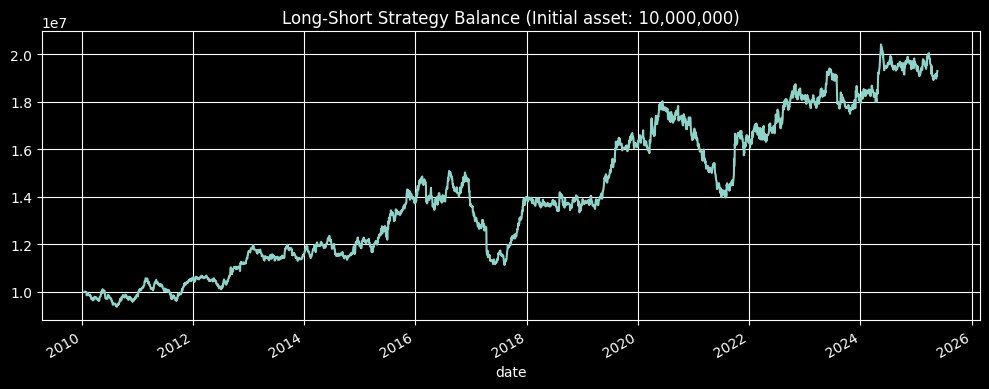


=== Strategy Performance Metrics ===
Annual Return: 4.56%
Max Drawdown: -26.26%
Sharpe Ratio: 0.51
Calmar Ratio: 0.17
Win Rate: 50.46%
Profit/Loss Ratio: 1.06
Avg Holding Days: 1
Weight combination (0.25,0.75,0.00) Sharpe: 0.507
Testing weights w1=0.50, w2=0.00, w3=0.50
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength 

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

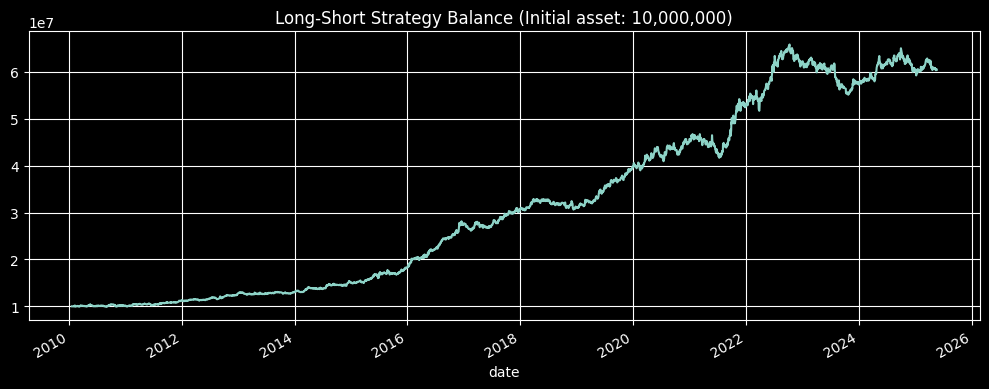


=== Strategy Performance Metrics ===
Annual Return: 12.96%
Max Drawdown: -16.29%
Sharpe Ratio: 1.30
Calmar Ratio: 0.80
Win Rate: 53.39%
Profit/Loss Ratio: 1.05
Avg Holding Days: 1
Weight combination (0.50,0.00,0.50) Sharpe: 1.300
Testing weights w1=0.50, w2=0.25, w3=0.25
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

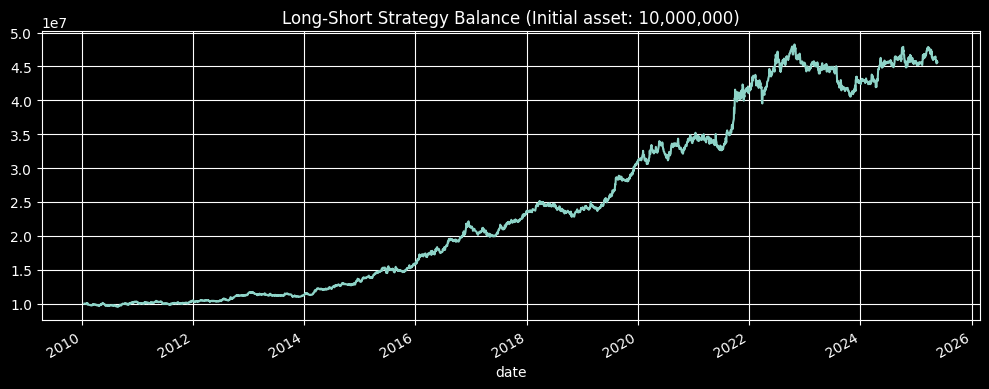


=== Strategy Performance Metrics ===
Annual Return: 10.83%
Max Drawdown: -15.90%
Sharpe Ratio: 1.09
Calmar Ratio: 0.68
Win Rate: 53.04%
Profit/Loss Ratio: 1.04
Avg Holding Days: 1
Weight combination (0.50,0.25,0.25) Sharpe: 1.085
Testing weights w1=0.50, w2=0.50, w3=0.00
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

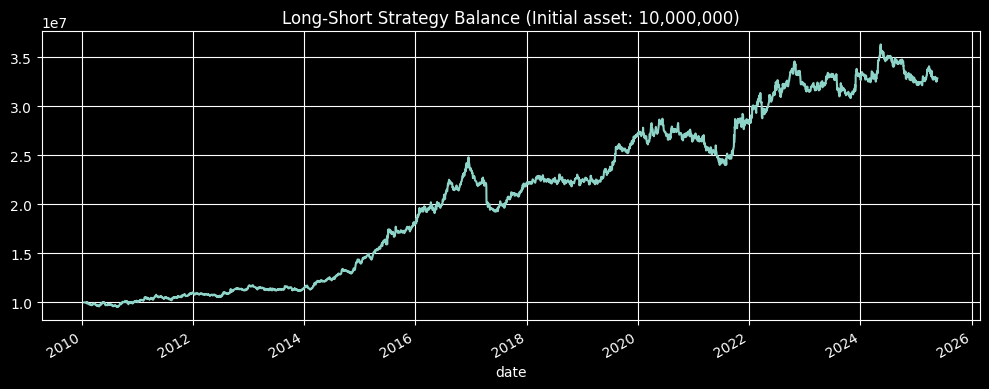


=== Strategy Performance Metrics ===
Annual Return: 8.39%
Max Drawdown: -22.32%
Sharpe Ratio: 0.86
Calmar Ratio: 0.38
Win Rate: 52.32%
Profit/Loss Ratio: 1.03
Avg Holding Days: 1
Weight combination (0.50,0.50,0.00) Sharpe: 0.861
Testing weights w1=0.75, w2=0.00, w3=0.25
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength 

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

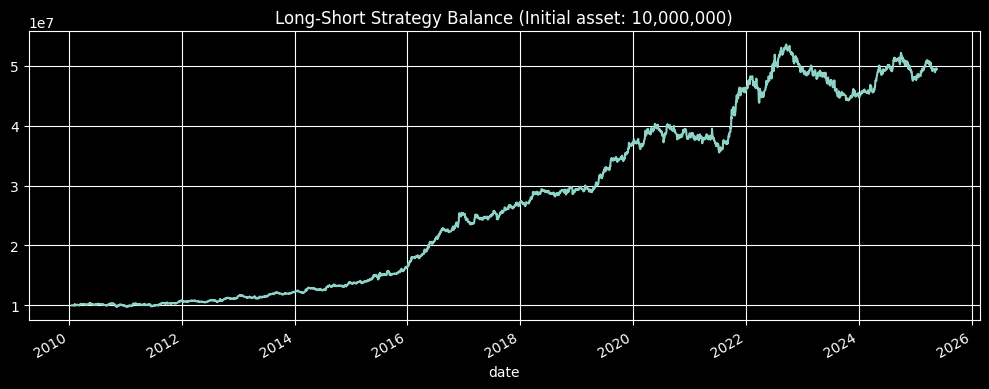


=== Strategy Performance Metrics ===
Annual Return: 11.43%
Max Drawdown: -17.46%
Sharpe Ratio: 1.19
Calmar Ratio: 0.65
Win Rate: 53.34%
Profit/Loss Ratio: 1.04
Avg Holding Days: 1
Weight combination (0.75,0.00,0.25) Sharpe: 1.187
Testing weights w1=0.75, w2=0.25, w3=0.00
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

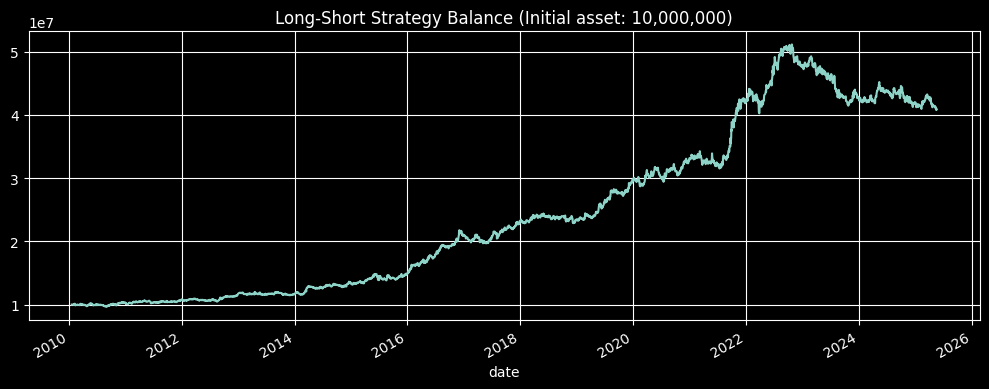


=== Strategy Performance Metrics ===
Annual Return: 10.00%
Max Drawdown: -20.18%
Sharpe Ratio: 1.02
Calmar Ratio: 0.50
Win Rate: 52.02%
Profit/Loss Ratio: 1.07
Avg Holding Days: 1
Weight combination (0.75,0.25,0.00) Sharpe: 1.017
Testing weights w1=1.00, w2=0.00, w3=0.00
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Skipping contract R_CN_CZC_OI_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength

C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_WH_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...


C:\Users\joanna\AppData\Local\Temp\ipykernel_86516\2047755719.py:18: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = pd.Series(price).pct_change().fillna(0)


Skipping contract R_CN_CZC_ZC_0004, error: Input y contains NaN.
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smoothness factors...
Calculating trend strength and smo

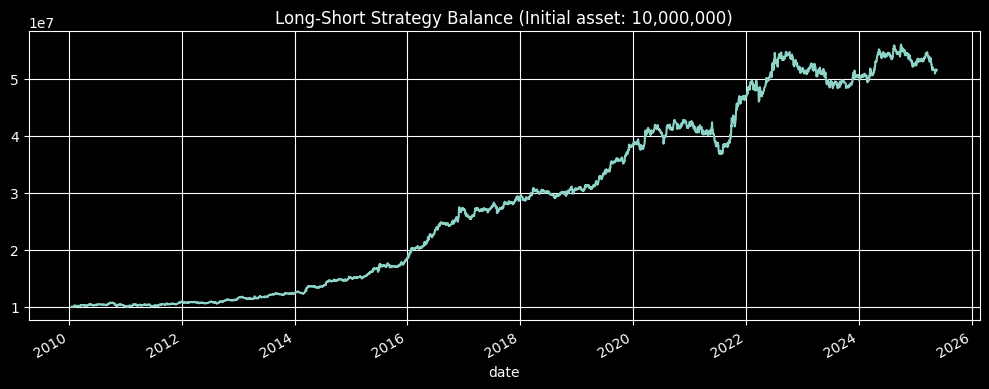


=== Strategy Performance Metrics ===
Annual Return: 11.75%
Max Drawdown: -13.97%
Sharpe Ratio: 1.22
Calmar Ratio: 0.84
Win Rate: 53.37%
Profit/Loss Ratio: 1.04
Avg Holding Days: 1
Weight combination (1.00,0.00,0.00) Sharpe: 1.223


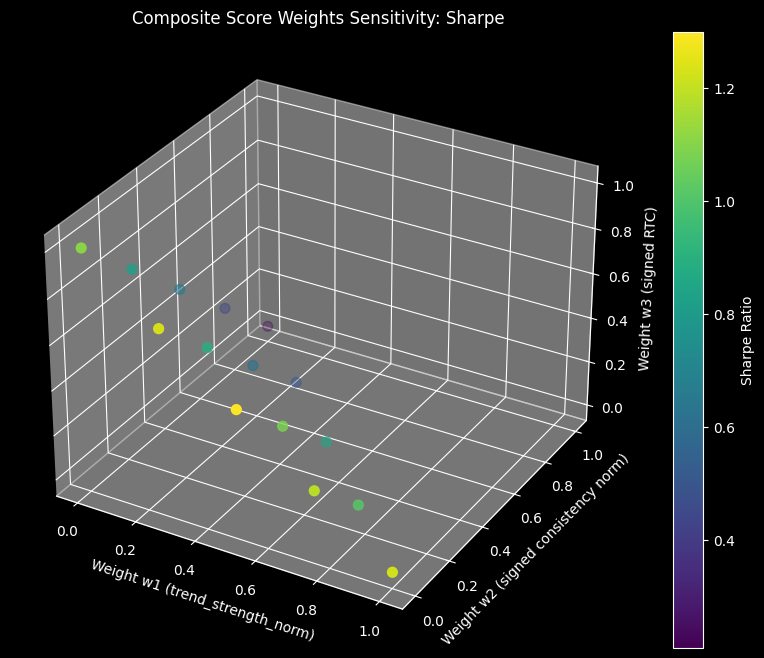

In [17]:
# 3D Weight Sensitivity Analysis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting support
import seaborn as sns

def composite_score_with_weights(df, w1, w2, w3):
    df = df.copy()
    df['composite_score'] = (
        w1 * df['trend_strength_norm'] +
        w2 * np.sign(df['trend_strength_norm']) * df['trend_consistency_norm'] +
        w3 * np.sign(df['trend_strength_norm']) * df['RTC']
    )
    return df

def calculate_sharpe(balance_series):
    returns = balance_series.pct_change().dropna()
    if returns.std() == 0:
        return 0
    return (returns.mean() / returns.std()) * np.sqrt(252)

def parameter_sensitivity_analysis_weights_3d(price_data, multiplier_df,
                                              w_steps=5,
                                              window=40, norm_window=50,
                                              init_cap=1e7, top_n=3):
    results = []
    weights = np.linspace(0, 1, w_steps)
    for w1 in weights:
        for w2 in weights:
            w3 = 1 - w1 - w2
            if w3 < 0 or w3 > 1:
                continue  # Weights must be valid
            print(f"Testing weights w1={w1:.2f}, w2={w2:.2f}, w3={w3:.2f}")

            all_scores = []
            for sym, df_price in price_data.items():
                try:
                    score_df = Alternative_calc_trend_factors(df_price, window=window, norm_window=norm_window)
                    score_df['symbol'] = sym
                    score_df = composite_score_with_weights(score_df, w1, w2, w3)
                    all_scores.append(score_df)
                except Exception as e:
                    print(f"Skipping contract {sym}, error: {e}")
                    continue
            if not all_scores:
                continue
            total_score_df = pd.concat(all_scores)

            pnl_df = run_long_short_backtest(total_score_df, price_data, multiplier_df,
                                            top_n=top_n, init_cap=init_cap)
            sharpe = calculate_sharpe(pnl_df['balance'])
            results.append({'w1': w1, 'w2': w2, 'w3': w3, 'sharpe': sharpe})
            print(f"Weight combination ({w1:.2f},{w2:.2f},{w3:.2f}) Sharpe: {sharpe:.3f}")

    result_df = pd.DataFrame(results)
    return result_df

# Call sensitivity analysis
result_weights_df = parameter_sensitivity_analysis_weights_3d(
    Alternative_price_data, multiplier_df,
    w_steps=5, window=10, norm_window=60,
    init_cap=1e7, top_n=3
)

# Plot 3D graph
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(result_weights_df['w1'], result_weights_df['w2'], result_weights_df['w3'],
                c=result_weights_df['sharpe'], cmap='viridis', s=50)

ax.set_xlabel('Weight w1 (trend_strength_norm)')
ax.set_ylabel('Weight w2 (signed consistency norm)')
ax.set_zlabel('Weight w3 (signed RTC)')
ax.set_title('Composite Score Weights Sensitivity: Sharpe')

fig.colorbar(sc, label='Sharpe Ratio')
plt.show()